## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
%matplotlib inline
import matplotlib.pyplot as plt

from collections import deque
# Imports for handling video files
from moviepy.editor import VideoFileClip
from IPython.display import HTML



# Global flag for visualisation purposes, set to true to visualise operations in each cell
visualisation_g = False

In [2]:
# Function to generate chessboard calibration points given a directory containing
# chessboard images
def generate_calibration_points(fpath):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints_t = [] # 3d points in real world space
    imgpoints_t = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(fpath)

    # Step through the list and search for chessboard corners
    for fname in images:
        img = plt.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints_t.append(objp)
            imgpoints_t.append(corners)

        # Draw and display the corners
        if (visualisation_g | visualisation_l):
            cimg = cv2.drawChessboardCorners(np.copy(img), (9,6), corners, ret)
            
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
            ax1.imshow(img)
            ax1.set_title('Original', fontsize=18)
            ax2.imshow(cimg)
            ax2.set_title('Corners Drawn', fontsize=18)

    return objpoints_t, imgpoints_t

calibration_fp = './camera_cal/calibration*.jpg'
objpoints, imgpoints = generate_calibration_points(calibration_fp)

## Compute the camera matrix and distortion coefficients

In [3]:
# Function to return an image after performing camera calibration and undistortion
def calibrate_and_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

# Loop through images to test calibration and undistortion
def test_calibration_distortion(images):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    for fname in images:
        img = plt.imread(fname)
        undistort_img = calibrate_and_undistort(img, objpoints, imgpoints)
        
        if (visualisation_g | visualisation_l):
            # Show undistorted image side by side with original
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
            ax1.imshow(img)
            ax1.set_title('Original', fontsize=18)
            ax2.imshow(undistort_img)
            ax2.set_title('Undistorted', fontsize=18)

# Make a list of calibration images
calib_images = glob.glob(calibration_fp)

test_calibration_distortion(calib_images)

# Store distortion matrix and calibration parameters
img = plt.imread(calib_images[0])
_, cam_mtx, dist_mtx, _, _ = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)


## Apply distortion correction to raw  images

In [4]:
# Apply undistortion to an image given the camera and distortion matrices
def correct_distortion(img, cam_mtx, dist_mtx):
    undistort_img = cv2.undistort(img, cam_mtx, dist_mtx, None, cam_mtx)

    return undistort_img
    
# Function to correct distortion on test images given the directory, returns list of
# undistorted images
def test_distortion_correction(fpath):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    result = []
    # Get the list of raw test images
    test_images = glob.glob(fpath)

    # Loop through images and undistort
    for fname in test_images:
        img = plt.imread(fname)

        # Apply undistortion
        undistort_img = correct_distortion(img, cam_mtx, dist_mtx)
        result.append(undistort_img)
        
        if (visualisation_g | visualisation_l):
            # Visualisation
            # Show undistorted image side by side with original
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
            ax1.imshow(img)
            ax1.set_title('Original', fontsize=18)
            ax2.imshow(undistort_img)
            ax2.set_title('Undistorted', fontsize=18)

    return result

# Store undistorted test images
raw_undist_images = test_distortion_correction('./test_images/*.jpg')

## Mask the region of interest

In [5]:
# def region_of_interest(img, vertices):
#     """
#     Applies an image mask.
    
#     Only keeps the region of the image defined by the polygon
#     formed from `vertices`. The rest of the image is set to black.
#     `vertices` should be a numpy array of integer points.
#     """
#     #defining a blank mask to start with
#     mask = np.zeros_like(img)   
    
#     #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
#     if len(img.shape) > 2:
#         channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
#         ignore_mask_color = (255,) * channel_count
#     else:
#         ignore_mask_color = 255
        
#     #filling pixels inside the polygon defined by "vertices" with the fill color    
#     cv2.fillPoly(mask, vertices, ignore_mask_color)
    
#     #returning the image only where mask pixels are nonzero
#     masked_image = cv2.bitwise_and(img, mask)
#     return masked_image

# mask_test_img = raw_undist_images[0]
# imshape = mask_test_img.shape
# mask_vertices = np.array([[(150, imshape[0]), (600, 420), (680, 420), (1150,imshape[0])]], dtype=np.int32)
# masked = region_of_interest(mask_test_img, mask_vertices)

#  # Visualisation
# # Show undistorted image side by side with original
# f, (ax1, ax2) = plt.subplots(1, 2)
# ax1.imshow(mask_test_img)
# ax1.set_title('Original Image')

# ax2.imshow(masked)
# ax2.set_title('Masked')

# # plt.waitforbuttonpress()
# # plt.close()

## Apply thresholds to create binary images

Start off by exploring which color channels offer the most information.

In [6]:
# Visualise each image in a list in various color channels
def explore_color_channels(images):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    if (visualisation_g | visualisation_l):
        for img in images:

            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
            hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

            f, axes = plt.subplots(4, 3, figsize=(20,10))
            f.tight_layout()
            # Original
            axes[0,0].imshow(img)
            axes[0,0].set_title('Original', fontsize=18)
            axes[0,0].axis('off')
            axes[0,1].axis('off')
            # Gray
            axes[0,2].imshow(gray, cmap='gray')
            axes[0,2].set_title('Gray', fontsize=18)
            axes[0,2].axis('off')
            # RGB
            axes[1,0].imshow(img[:,:,0], cmap='gray')
            axes[1,0].set_title('R', fontsize=18)
            axes[1,0].axis('off')
            axes[1,1].imshow(img[:,:,1], cmap='gray')
            axes[1,1].set_title('G', fontsize=18)
            axes[1,1].axis('off')
            axes[1,2].imshow(img[:,:,2], cmap='gray')
            axes[1,2].set_title('B', fontsize=18)
            axes[1,2].axis('off')
            # HLS
            axes[2,0].imshow(hls[:,:,0], cmap='gray')
            axes[2,0].set_title('H', fontsize=18)
            axes[2,0].axis('off')
            axes[2,1].imshow(hls[:,:,1], cmap='gray')
            axes[2,1].set_title('L', fontsize=18)
            axes[2,1].axis('off')
            axes[2,2].imshow(hls[:,:,2], cmap='gray')
            axes[2,2].set_title('S', fontsize=18)
            axes[2,2].axis('off')
            # HSV
            axes[3,0].imshow(hsv[:,:,0], cmap='gray')
            axes[3,0].set_title('H', fontsize=18)
            axes[3,0].axis('off')
            axes[3,1].imshow(hsv[:,:,1], cmap='gray')
            axes[3,1].set_title('S', fontsize=18)
            axes[3,1].axis('off')
            axes[3,2].imshow(hsv[:,:,2], cmap='gray')
            axes[3,2].set_title('V', fontsize=18)
            axes[3,2].axis('off')

#             plt.waitforbuttonpress()
#             plt.close()

explore_color_channels(raw_undist_images)

Possible channel options: gray, (R)GB, HL(S), HS(V).

Compare these by applying color thresholds to get binary images.

In [7]:
#### Apply color thresholds to an image channel and return binary image
def color_thresh(img_chl, thresh):
    binary = np.zeros_like(img_chl)
    binary[(img_chl > thresh[0]) & (img_chl <= thresh[1])] = 1

    return binary

# Visualise thresholds on color channels as binary images
def test_color_thresholds(images):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    if (visualisation_g | visualisation_l):
        for img in images[:]:
            # Obtain color channels
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
            hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            # Apply thresholds
            gray_thresh = color_thresh(gray, (120, 255))
            r_thresh = color_thresh(img[:,:,0], (120, 255))
            hls_h_thresh = color_thresh(hls[:,:,0], (15, 50))
            hls_s_thresh = color_thresh(hls[:,:,2], (100, 255))
            hsv_v_thresh = color_thresh(hsv[:,:,2], (120, 255))

            f, axes = plt.subplots(5, 2, figsize=(10,20))
            f.tight_layout()
            # Gray
            axes[0,0].imshow(gray, cmap='gray')
            axes[0,0].set_title('Gray', fontsize=18)
            axes[0,0].axis('off')
            axes[0,1].imshow(gray_thresh, cmap='gray')
            axes[0,1].set_title('Gray binary', fontsize=18)
            axes[0,1].axis('off')
            # Red
            axes[1,0].imshow(img[:,:,0], cmap='gray')
            axes[1,0].set_title('Red', fontsize=18)
            axes[1,0].axis('off')
            axes[1,1].imshow(r_thresh, cmap='gray')
            axes[1,1].set_title('Red binary', fontsize=18)
            axes[1,1].axis('off')
            # (H)LS
            axes[2,0].imshow(hls[:,:,0], cmap='gray')
            axes[2,0].set_title('(H)LS', fontsize=18)
            axes[2,0].axis('off')
            axes[2,1].imshow(hls_h_thresh, cmap='gray')
            axes[2,1].set_title('(H)LS binary', fontsize=18)
            axes[2,1].axis('off')
            # HL(S)
            axes[3,0].imshow(hls[:,:,2], cmap='gray')
            axes[3,0].set_title('HL(S)', fontsize=18)
            axes[3,0].axis('off')
            axes[3,1].imshow(hls_s_thresh, cmap='gray')
            axes[3,1].set_title('HL(S) binary', fontsize=18)
            axes[3,1].axis('off')
            # HS(V)
            axes[4,0].set_title('HS(V)', fontsize=18)
            axes[4,0].imshow(hsv[:,:,2], cmap='gray')
            axes[4,0].axis('off')
            axes[4,1].imshow(hsv_v_thresh, cmap='gray')
            axes[4,1].set_title('HS(V) binary', fontsize=18)
            axes[4,1].axis('off')

#             plt.waitforbuttonpress()
            
#         plt.close('all')

test_color_thresholds(raw_undist_images)

Overall, **gray** and HLS **saturation** reveal the most information with other channels giving redundant information. Saturation is especially important since it is the only one to function correctly over shadowy areas although the gray channel is able to detect lanes futher away.

Convert saturation channel to binary images:

In [8]:
# Apply saturation thresholding in the HLS space and return a binary image
def saturation_threshold(img, thresh):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_binary = color_thresh(hls[:,:,2], thresh)

    return s_binary

# Given a list of colour images and threshold, return a list of thresholded binary images
# from the HLS saturation channel
def test_saturation_threshold(raw_images, thresh):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False
    result=[]

    for img in raw_images[:]:
        s_binary = saturation_threshold(img, thresh)
        result.append(s_binary)

        if (visualisation_g | visualisation_l):
            # Visualisation
            f, axes = plt.subplots(1, 2, figsize=(20,10))
            f.tight_layout()
            # Original
            axes[0].imshow(img)
            axes[0].set_title('Original', fontsize=18)
            axes[0].axis('off')
            # S 180
            axes[1].imshow(s_binary, cmap='gray')
            axes[1].set_title('S 180', fontsize=18)
            axes[1].axis('off')

#             plt.waitforbuttonpress()
#             plt.close()

    return result

colour_binary_output = test_saturation_threshold(raw_undist_images, (180, 255))

## Explore gradient thresholding

First, test various parameters to approximate the most optimal parameters based on the test images.

In [9]:
# Function to apply a Sobel operator and return binary image after thresholding
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    else:
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    binary = np.zeros_like(scaled_sobel)
    binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary

# Function to apply both Sobel x & y and return binary image after thresholding
def mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    mag = np.sqrt(sobelx**2 + sobely**2)

    scaled_mag = np.uint8(255 * mag / np.max(mag))
    binary = np.zeros_like(scaled_mag)
    binary[(scaled_mag >= thresh[0]) & (scaled_mag <= thresh[1])] = 1

    return binary

# Function to calculate gradient direction and return binary image after thresholding
def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    dir = np.arctan2(sobely, sobelx)

    binary = np.zeros_like(dir)
    binary[(dir >= thresh[0]) & (dir <= thresh[1])] = 1

    return binary

# Test gradient thresholds
def test_grad_thresholds(raw_undist_images):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    if (visualisation_g | visualisation_l):
        gradx_thres = [(30, 100),(30, 200),(50, 255)]
        grady_thres = [(30, 100),(30, 200),(50, 255)]
        mag_thres = [(50, 255),(80, 255),(100, 255)]
        dir_thres = [(0.5, 1.3),(0.7, 1.3),(0.9, 1.3)]

        for img in raw_undist_images:
            # Visualisation
            f, axes = plt.subplots(4, 3, figsize=(50, 35))
            f.tight_layout()
            for i,k in enumerate(gradx_thres):
                # Apply each thresholding function to each image
                gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=9, thresh=gradx_thres[i])
                grady = abs_sobel_thresh(img, orient='y', sobel_kernel=9, thresh=grady_thres[i])
                mag_binary = mag_thresh(img, sobel_kernel=9, thresh=mag_thres[i])
                dir_binary = dir_thresh(img, sobel_kernel=9, thresh=dir_thres[i])

                axes[0,i].imshow(gradx, cmap='gray')
                axes[0,i].set_title('Sobel x, K=9'+str(gradx_thres[i]), fontsize=24)
                axes[0,i].axis('off')

                axes[1,i].imshow(grady, cmap='gray')
                axes[1,i].set_title('Sobel y, K=9'+str(grady_thres[i]), fontsize=24)
                axes[1,i].axis('off')

                axes[2,i].imshow(mag_binary, cmap='gray')
                axes[2,i].set_title('Magnitude, K=9'+str(mag_thres[i]), fontsize=24)
                axes[2,i].axis('off')

                axes[3,i].imshow(dir_binary, cmap='gray')
                axes[3,i].set_title('Direction, K=9'+str(dir_thres[i]), fontsize=24)
                axes[3,i].axis('off')

#             plt.waitforbuttonpress()
#             plt.close()

test_grad_thresholds(raw_undist_images)

Optimal parameters: kernel size: 9, thresholds: \[Gradient x & y: 50, 255, Magnitude: 80, 255, Direction: 0.7, 1.3\]. These parameters work best for images without shadows and bright light where using gradient thresholding is suboptimal and should be replaced with colour thresholding.

Next, combine the thresholds to improve the output binary image and store the result.

In [10]:
# Combines thresholded images from various gradients to give a single binary output
def combined_gradient_thresholding(img, g_thresh=(0,255), m_thresh=(0,255), d_thresh=(0,np.pi/2), ksize=9):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    # Apply each thresholding function to each image
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=g_thresh)
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=g_thresh)
    mag_binary = mag_thresh(img, sobel_kernel=ksize, thresh=m_thresh)
    dir_binary = dir_thresh(img, sobel_kernel=ksize, thresh=d_thresh)

    # Combine thresholds
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    if (visualisation_g | visualisation_l):
            # Visualisation
            f, axes = plt.subplots(3, 2, figsize=(30, 20))
            f.tight_layout()
            axes[0,0].imshow(gradx, cmap='gray')
            axes[0,0].set_title('Sobel x', fontsize=18)
            axes[0,0].axis('off')

            axes[0,1].imshow(grady, cmap='gray')
            axes[0,1].set_title('Sobel y', fontsize=18)
            axes[0,1].axis('off')

            axes[1,0].imshow(mag_binary, cmap='gray')
            axes[1,0].set_title('Magnitude', fontsize=18)
            axes[1,0].axis('off')

            axes[1,1].imshow(dir_binary, cmap='gray')
            axes[1,1].set_title('Direction', fontsize=18)
            axes[1,1].axis('off')

            axes[2,0].imshow(img)
            axes[2,0].set_title('Original', fontsize=18)
            axes[2,0].axis('off')

            axes[2,1].imshow(combined, cmap='gray')
            axes[2,1].set_title('Combined', fontsize=18)
            axes[2,1].axis('off')

#             plt.waitforbuttonpress()
#             plt.close()

    return combined

# Applies gradient thresholding to a list of images and returns a list of binary images
def test_combined_gradient_thresholding(raw_images, g_thresh=(30,255), m_thresh=(80,255), d_thresh=(0.7,1.3), ksize=9):
    result=[]

    for img in raw_images:
        combined = combined_gradient_thresholding(img, g_thresh, m_thresh, d_thresh, ksize)
        # Store the result
        result.append(combined)

    return result

grad_binary_output = test_combined_gradient_thresholding(raw_undist_images, g_thresh=(30,255), m_thresh=(80,255), d_thresh=(0.7,1.3), ksize=9)

## Unify colour and gradient binary images


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


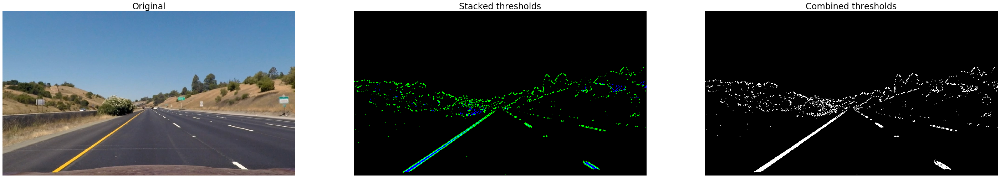

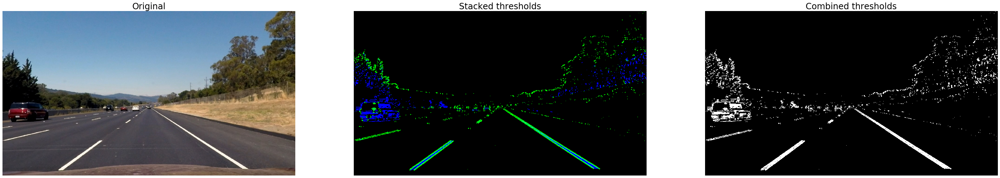

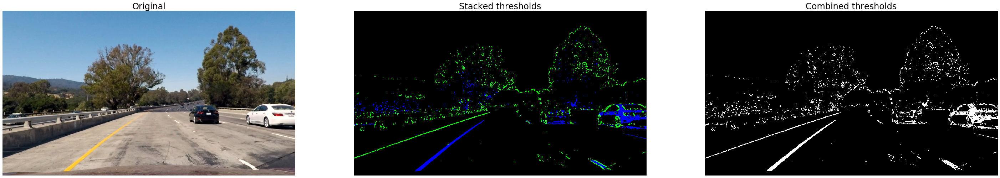

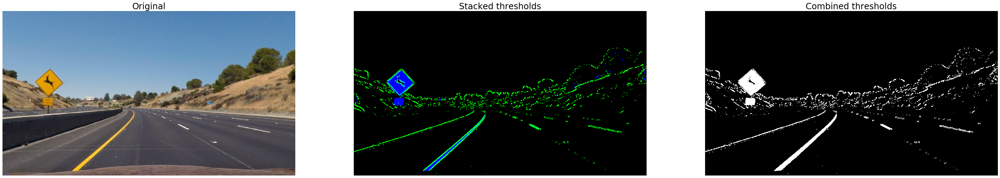

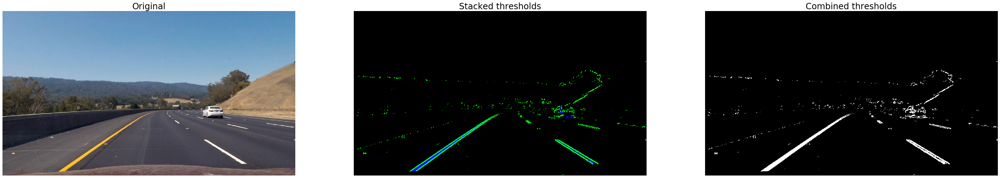

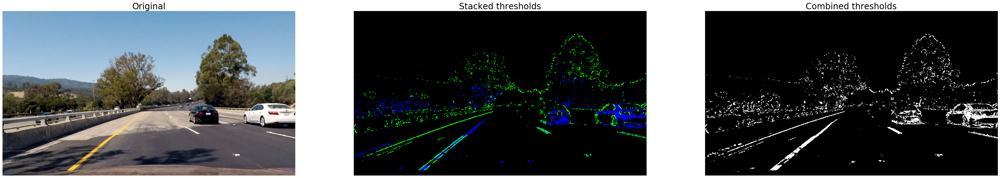

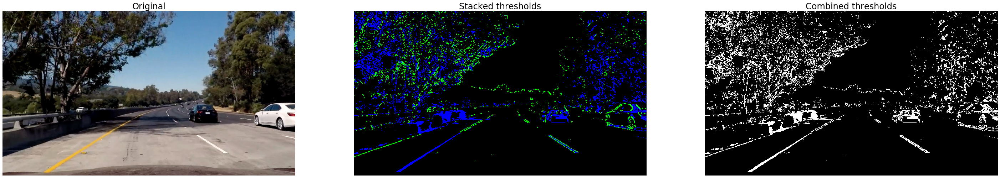

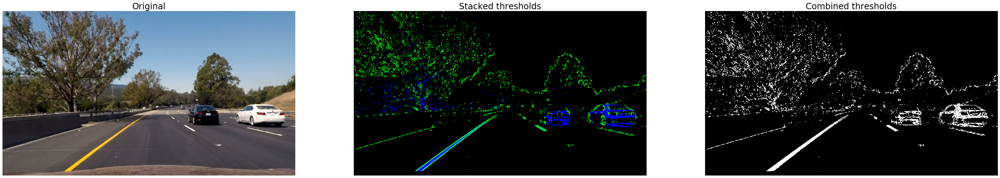

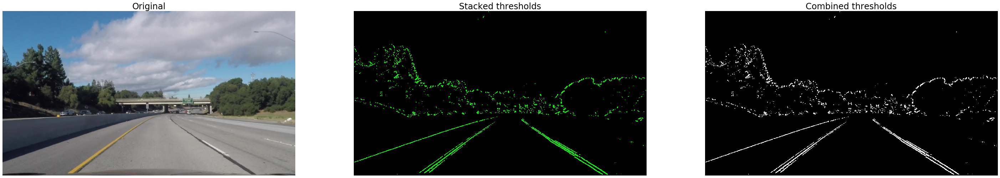

In [11]:
# OR-combine two binary images and return result
def or_combine_binaries(grad_binary, colour_binary): 
    combined_binary = np.zeros_like(grad_binary)
    combined_binary[(grad_binary == 1) | (colour_binary == 1)] = 1
    
    return combined_binary
    

# OR-combine two lists of binary images into a single binary image
def test_or_combine_binaries(gradient_binaries, colour_binaries):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False
    result=[]

    for orig, grad_binary, colour_binary in zip(raw_undist_images, gradient_binaries, colour_binaries):
        # Stack binary images to visualise contribution
        stacked_binary = np.dstack((np.zeros_like(grad_binary), grad_binary, colour_binary)) * 255
        # Combine-OR the binary images
        combined_binary = or_combine_binaries(grad_binary, colour_binary)
        result.append(combined_binary)

        if (visualisation_g | visualisation_l):
            # Visualisation
            f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(50,25))
            ax1.set_title('Original', fontsize=24)
            ax1.imshow(orig)
            ax1.axis('off')
            ax2.set_title('Stacked thresholds', fontsize=24)
            ax2.imshow(stacked_binary)
            ax2.axis('off')
            ax3.set_title('Combined thresholds', fontsize=24)
            ax3.imshow(combined_binary, cmap='gray')
            ax3.axis('off')

#             plt.waitforbuttonpress()
#             plt.close()

    return result

# OR-combine the gradient and colour binaries into a single binary image
combined_binary_imgs = test_or_combine_binaries(grad_binary_output, colour_binary_output)

## Apply a perspective transform to rectify binary image ("birds-eye view")

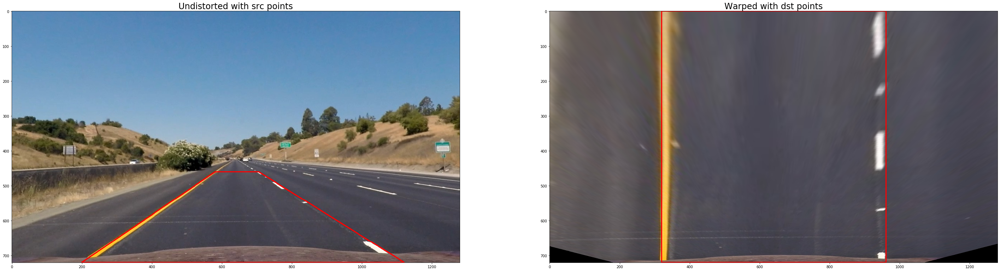

In [16]:
# Calculate perspective transforms given source and destination points
def calculate_persp_transforms(src_points, dst_points):
    # Calculate transformation matrix
    perspective_M = cv2.getPerspectiveTransform(src_points, dst_points)
    # Calculate inverse matrix
    perspective_invM = cv2.getPerspectiveTransform(dst_points, src_points)

    return perspective_M, perspective_invM

# Given a perspective matrix, apply the transform on an image
def test_perspective_transform(img, persp_mtx, img_size):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    if (visualisation_g | visualisation_l):
        # Warp image using matrix   
        warped_img = cv2.warpPerspective(img, persp_mtx, img_size)

        # Draw lines between source points on image
        cv2.line(img, tuple(src_points[0]), tuple(src_points[1]), [255,0,0], 2)
        cv2.line(img, tuple(src_points[1]), tuple(src_points[2]), [255,0,0], 2)
        cv2.line(img, tuple(src_points[2]), tuple(src_points[3]), [255,0,0], 2)
        cv2.line(img, tuple(src_points[3]), tuple(src_points[0]), [255,0,0], 2)
        
        # Draw lines between destination points on image
        cv2.line(warped_img, tuple(dst_points[0]), tuple(dst_points[1]), [255,0,0], 2)
        cv2.line(warped_img, tuple(dst_points[1]), tuple(dst_points[2]), [255,0,0], 2)
        cv2.line(warped_img, tuple(dst_points[2]), tuple(dst_points[3]), [255,0,0], 2)
        cv2.line(warped_img, tuple(dst_points[3]), tuple(dst_points[0]), [255,0,0], 2)

        # Visualisation
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(50,20))
        ax1.set_title('Undistorted with src points', fontsize=24)
        ax1.imshow(img)
        ax2.set_title('Warped with dst points', fontsize=24)
        ax2.imshow(warped_img)
        
#         plt.waitforbuttonpress()
#         plt.close()

# Hand picked points based on 'straight_lines1.jpg'
# Source points
src_points = np.float32([[580, 460], [200, 719], [1120, 719], [705, 460]])
# Destination points
dst_points = np.float32([[320, 0], [320, 719], [960, 719], [960, 0]])
# Get transforms
perspective_M, perspective_invM = calculate_persp_transforms(src_points, dst_points)

# Perform perspective transform on test image
test_perspective_transform(np.copy(raw_undist_images[0]), perspective_M, (img.shape[1], img.shape[0]))

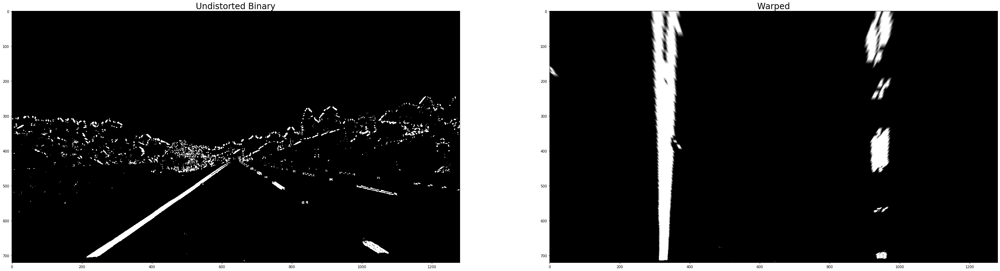

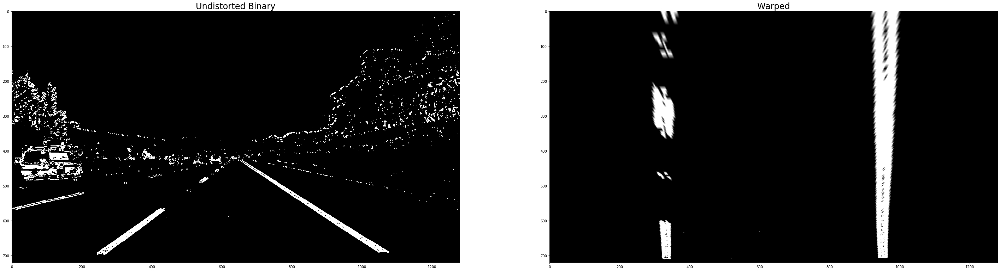

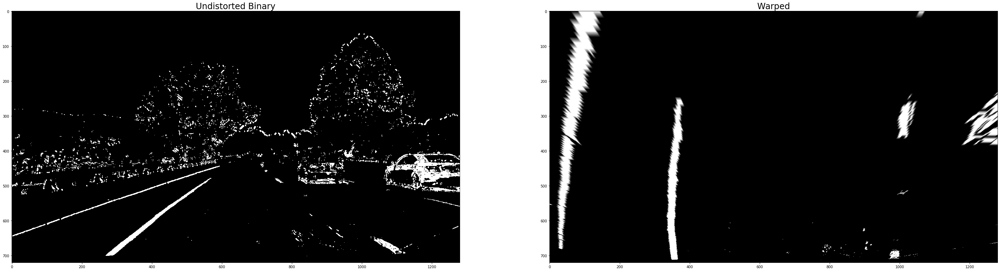

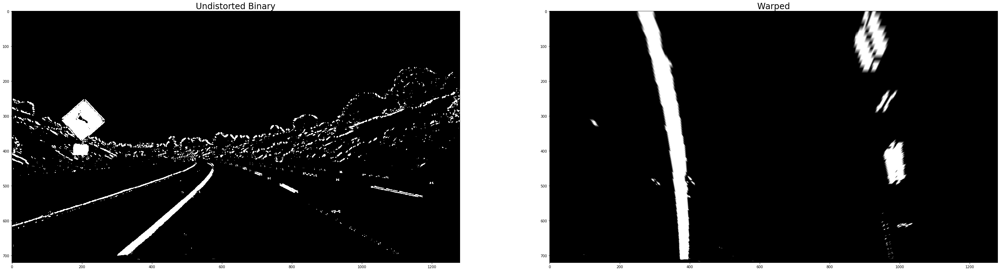

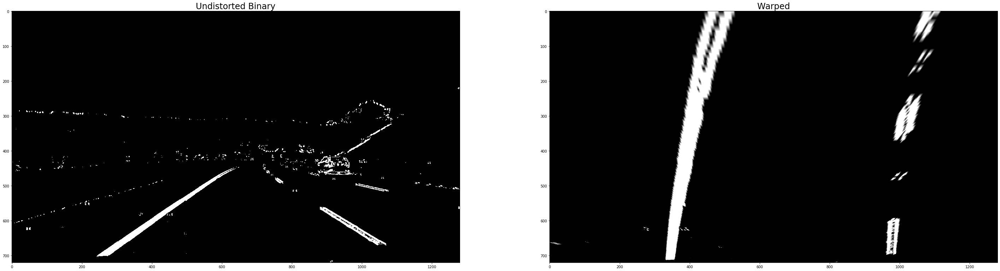

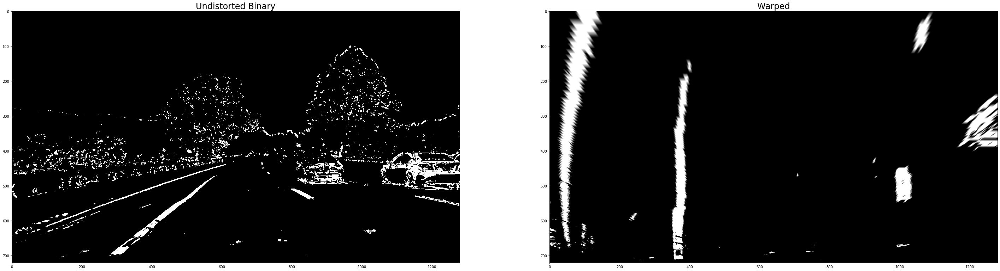

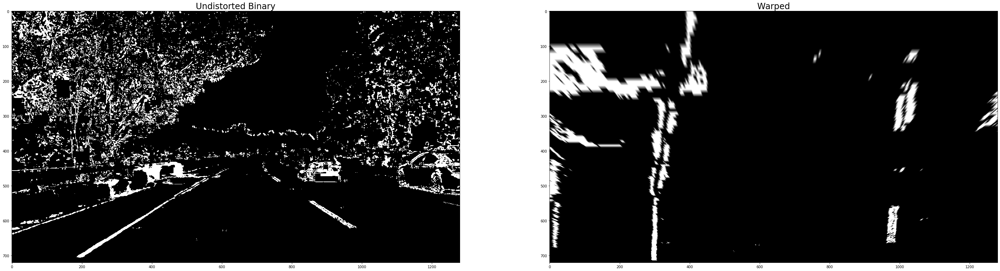

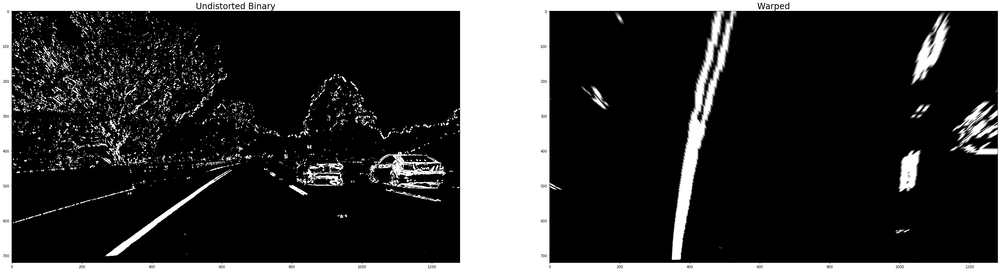

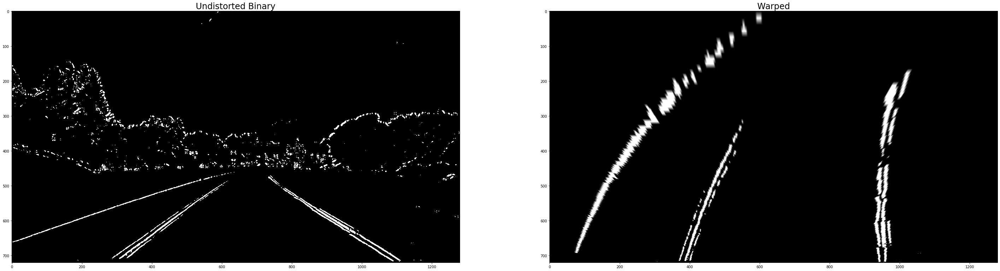

In [17]:
# Apply a given perspective transform to a list of images
def apply_perspective_transform(images, persp_mtx):
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = True
    result = []

    for img in images[:]:
        warped = cv2.warpPerspective(img, persp_mtx, (img.shape[1], img.shape[0]))
        result.append(warped)

        if (visualisation_g | visualisation_l):
            # Visualisation
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(50,20))
            ax1.set_title('Undistorted Binary', fontsize=24)
            ax1.imshow(img, cmap='gray')
            ax2.set_title('Warped', fontsize=24)
            ax2.imshow(warped, cmap='gray')
#             plt.waitforbuttonpress()
#             plt.close()

    return result

# Apply the obtained perspective transform to all binary images
persp_binary_imgs = apply_perspective_transform(combined_binary_imgs, perspective_M)

## Detect lane pixels and lane boundary

Use the peaks in the histogram of the image to detect pixels corresponding to left and right lanes and use a sliding window to follow the lanes vertically to the top of the frame. Fit a polynomial on the pixels to determine lane boundary.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


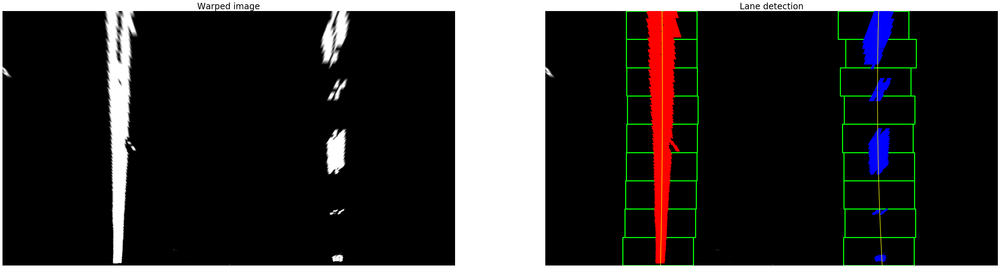

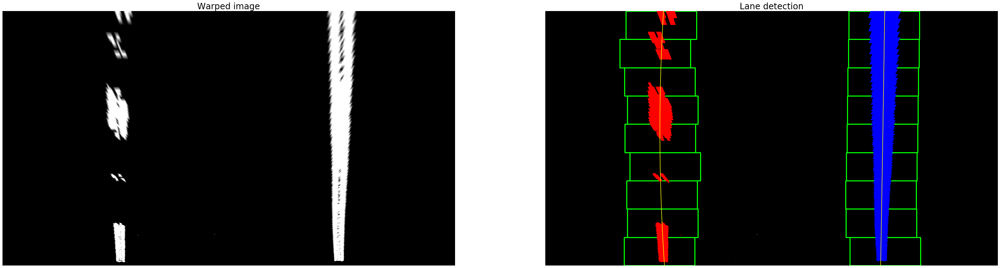

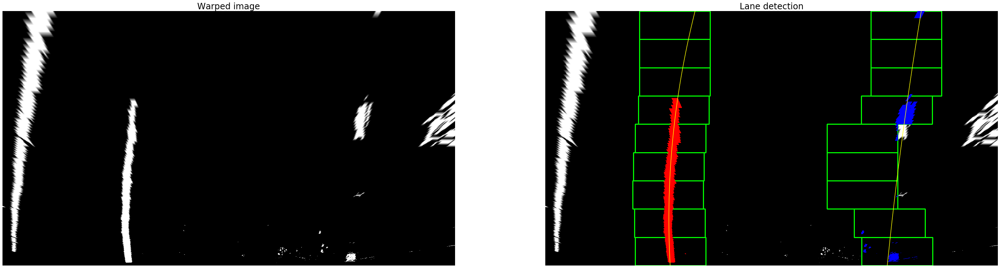

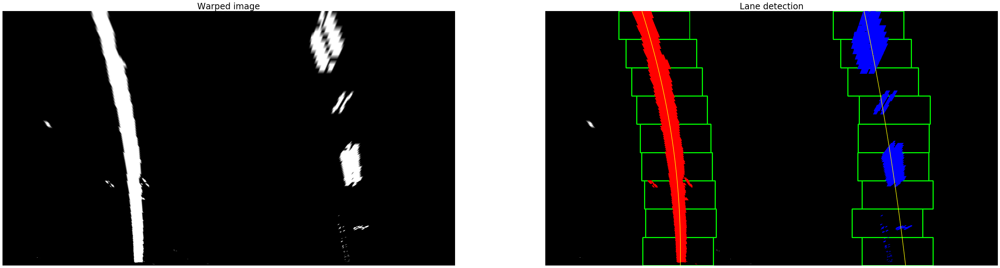

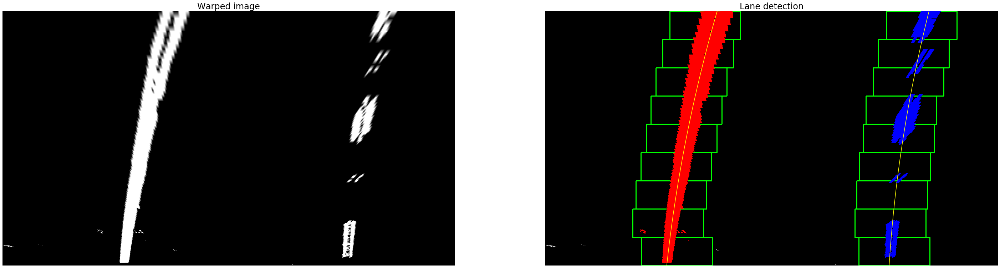

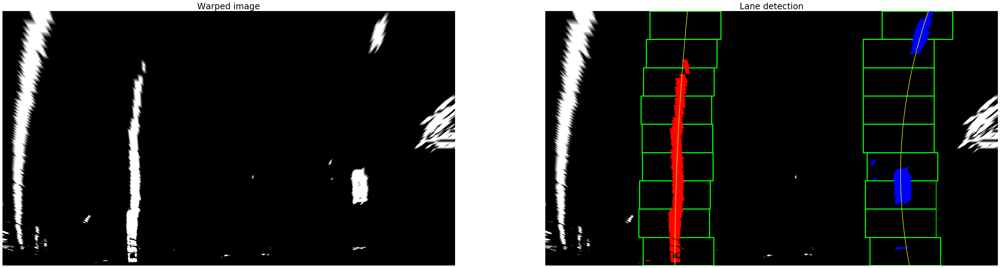

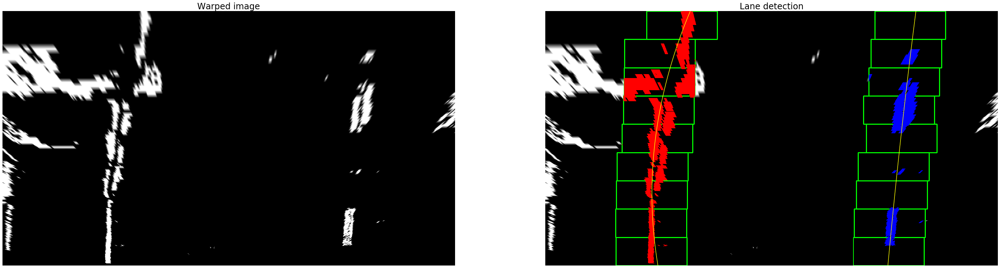

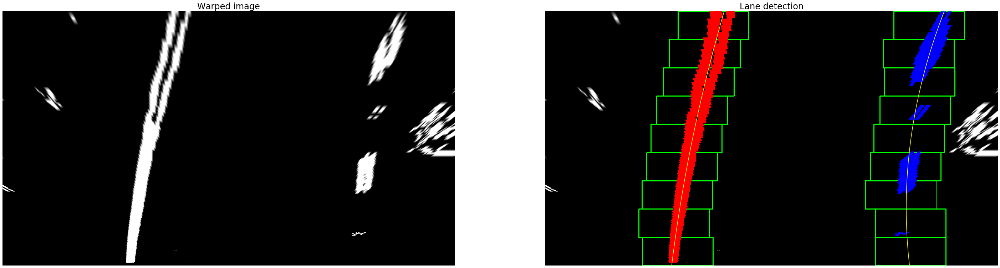

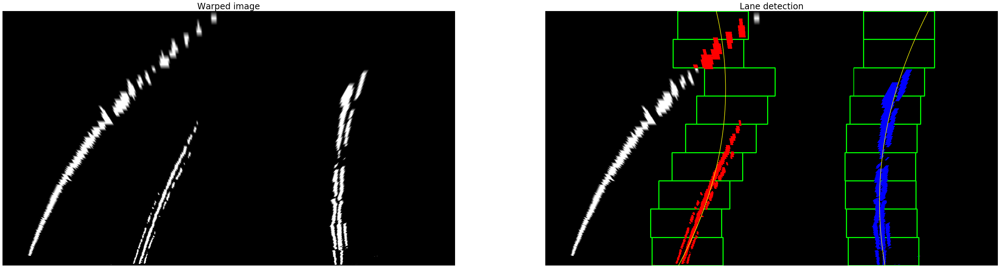

In [51]:
# Convert binary image to histogram
def hist(img):
    # Lane lines are likely to be in the bottom half of the image
    bottom_half = img[ img.shape[0]//2:, :]
    histogram = np.sum(bottom_half, axis=0)

    return histogram

# Find pixels associated with left and right lanes in a warped binary image using a sliding window
def find_lane_pixels(warped_binary_img):
    # Histogram of bottom-half of image
    histogram = hist(warped_binary_img)
    # Output image for visualisation
    output_img = np.dstack((warped_binary_img, warped_binary_img, warped_binary_img))

    # Find the left & right peak in histogram to use as the base for the lanes
    midpoint = np.int(histogram.shape[0]//2)
    left_base_x = np.argmax(histogram[:midpoint])
    right_base_x = midpoint + np.argmax(histogram[midpoint:]) 

    # Set up hyperparameters for sliding windows
    nwindows = 9
    margin = 100
    min_pixels = 50

    # Set up window parameters
    win_height = np.int(warped_binary_img.shape[0] // nwindows)
    # Current x positions for left and right window
    leftx_current = left_base_x
    rightx_current = right_base_x

    # Identify x and y positions of all non-zero pixels in the image
    nonzeros = warped_binary_img.nonzero()
    # Separate into x and y
    nonzerox = np.array(nonzeros[1])
    nonzeroy = np.array(nonzeros[0])

    # Capture left and right lane indices
    left_lane_indices = []
    right_lane_indices = []

    # Loop through no. of windows with a window for each lane
    for win in range(nwindows):
        # Position left and right window
        # Both windows share the same y-values
        y_min = warped_binary_img.shape[0] - ((win+1) * win_height)
        y_max = warped_binary_img.shape[0] - (win * win_height)
        # x-values for left window
        leftx_min = leftx_current - margin
        leftx_max = leftx_current + margin
        # x-values for right window
        rightx_min = rightx_current - margin
        rightx_max = rightx_current + margin

        # Identify the non-zero pixels within the windows
        left_win_actives = ((nonzerox >= leftx_min) & (nonzerox <= leftx_max) & 
        (nonzeroy >= y_min) & (nonzeroy <= y_max)).nonzero()[0]
        right_win_actives = ((nonzerox >= rightx_min) & (nonzerox <= rightx_max) & 
        (nonzeroy >= y_min) & (nonzeroy <= y_max)).nonzero()[0]

        # Append these indices to the list of lane indices
        left_lane_indices.append(left_win_actives)
        right_lane_indices.append(right_win_actives)

        # Recenter window if required (i.e. when there is a curve)
        if len(left_win_actives) > min_pixels:
            leftx_current = np.int(np.mean(nonzerox[left_win_actives]))
        if len(right_win_actives) > min_pixels:
            rightx_current = np.int(np.mean(nonzerox[right_win_actives]))

        # Visualisation
        # Draw a rectangle for each left/right window on the output image
        cv2.rectangle(output_img, (leftx_min, y_min), (leftx_max, y_max), [0,255,0], 2)
        cv2.rectangle(output_img, (rightx_min, y_min), (rightx_max, y_max), [0,255,0], 2)

    # Concatenate array to flatten lists
    left_lane_indices = np.concatenate(left_lane_indices)
    right_lane_indices = np.concatenate(right_lane_indices)

    # Extract all the pixel positions for each lane
    leftx = nonzerox[left_lane_indices]
    lefty = nonzeroy[left_lane_indices]
    rightx = nonzerox[right_lane_indices]
    righty = nonzeroy[right_lane_indices]

    return leftx, lefty, rightx, righty, output_img

# Fit a polynomial over the pixel region
def fit_polynomial(leftx, lefty, rightx, righty, img_shape):
    # Fit a 2nd order polynomial
    # x and y switched due to the np.shape attribute switching dimensions
    left_lane_coeffs = np.polyfit(lefty, leftx, 2)
    right_lane_coeffs = np.polyfit(righty, rightx, 2)

    # Generate points for plotting polynomial
    # x and y switched because lane lines are expected to be vertically-oriented
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    left_fitx = left_lane_coeffs[0] * ploty ** 2 + left_lane_coeffs[1] * ploty + left_lane_coeffs[2]
    right_fitx = right_lane_coeffs[0] * ploty ** 2 + right_lane_coeffs[1] * ploty + right_lane_coeffs[2]  

    return left_fitx, right_fitx, ploty, left_lane_coeffs, right_lane_coeffs

# Visualisation of pixels comprising a lane
def visualise_lane(output_img, leftx, lefty, rightx, righty):
    # Highlight left and right pixel regions on the output image
    output_img[lefty, leftx] = [255, 0, 0]
    output_img[righty, rightx] = [0, 0, 255]

    return output_img

# Extract lanes and fit a polynomial over a warped binary image
def extract_lanes(warped_binary_img):
    # Obtain lane pixels
    leftx, lefty, rightx, righty, output_img = find_lane_pixels(warped_binary_img)
    # Fit a polynomial over pixels
    left_fitx, right_fitx, ploty, _, _ = fit_polynomial(leftx, lefty, rightx, righty, warped_binary_img.shape)
    # Draw the pixels and polynomial on the output image
    output_img = visualise_lane(output_img, leftx, lefty, rightx, righty)

    return output_img, left_fitx, right_fitx, ploty

# Test the lane detection on test images
def test_lane_detection():
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    if (visualisation_g | visualisation_l):      
        for img in persp_binary_imgs[:]:
            output, left_fitx, right_fitx, ploty = extract_lanes(img)

            # Visualisation
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(50,20))
            ax1.set_title('Warped image', fontsize=24)
            ax1.imshow(img, cmap='gray')
            ax1.axis('off')
            ax2.set_title('Lane detection', fontsize=24)
            ax2.imshow(output)
            ax2.axis('off')

            # Draw the polynomial
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')


#             plt.waitforbuttonpress()
#             plt.close()

test_lane_detection()

In [18]:
# Draw two areas on a blank image using given coordinates and a margin in the x-axis
def draw_poly_search_area(left_fitx, right_fitx, ploty, margin, window_img):
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))

    return window_img

def focus_find_lane_pixels(warped_binary_img, left_coeffs, right_coeffs):
    # Create an image to draw on and an image to show the selection window
    output_img = np.dstack((warped_binary_img, warped_binary_img, warped_binary_img))*255
    window_img = np.zeros_like(out_img)

    # Hyperparameters
    # Margin around polynomial to search
    margin = 100

    # Get activated pixels
    nonzeros = warped_binary_img.nonzero()
    nonzeroy = np.array(nonzeros[0])
    nonzerox = np.array(nonzeros[1])

    # Search area of activated pixels using polynomial from previous frame
    left_lane_inds = ((nonzerox >= (left_coeffs[0] * nonzeroy ** 2 + left_coeffs[1] * nonzeroy + left_coeffs[2]) - margin) &
                       (nonzerox < (left_coeffs[0] * nonzeroy ** 2 + left_coeffs[1] * nonzeroy + left_coeffs[2]) + margin))
    right_lane_inds = ((nonzerox >= (right_coeffs[0] * nonzeroy ** 2 + right_coeffs[1] * nonzeroy + right_coeffs[2]) - margin) &
                       (nonzerox < (right_coeffs[0] * nonzeroy ** 2 + right_coeffs[1] * nonzeroy + right_coeffs[2]) + margin))

    # Extract pixel positions for each lane
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, window_img


# Using a polynomial from a previous frame, focus the search area for lanes in subsequent frames
# around the polynomial
def optimised_lane_search(warped_binary_img, left_coeffs, right_coeffs):
    # Focus the search area to find lane pixels
    leftx, lefty, rightx, righty, window_img = focus_find_lane_pixels(warped_binary_img, left_coeffs, right_coeffs)
    # Fit new polynomial
    left_fitx, right_fitx, ploty, left_lane_coeffs, right_lane_coeffs = fit_polynomial(leftx, lefty, rightx, righty, warped_binary_img.shape)

    # Visualisation
    # Draw the search area for the lanes
    window_img = draw_poly_search_area(left_fitx, right_fitx, ploty, margin, window_img)
    # Draw the pixels and polynomial
    output_img = visualise_lane(output_img, leftx, lefty, rightx, righty)
    # Combine the two images
    result = cv2.addWeighted(output_img, 1, window_img, 0.3, 0)

    return result, ploty, left_lane_coeffs, right_lane_coeffs

## Determine the radius of curvature for each lane and vehicle position with respect to center of the lane

Convert pixels to world space and find the radius of curvature of the lane in metres.

Additionally, calculate the offset of the car from the lane center as the distance of the center of the car from the mean of the left and right lanes. This assumes the camera is mounted on the center of the car.


In [19]:
# Measure curvature of polynomial in metres
def measure_curvature(left_lane_coeffs, right_lane_coeffs, y):
    # Convert coeffs to world space
    left_lane_cr = [(xm_per_pix / ym_per_pix **2) * left_lane_coeffs[0], (xm_per_pix / ym_per_pix) * left_lane_coeffs[1], left_lane_coeffs[2]]
    right_lane_cr = [(xm_per_pix / ym_per_pix **2) * right_lane_coeffs[0], (xm_per_pix / ym_per_pix) * right_lane_coeffs[1], right_lane_coeffs[2]]

    # Calculate radius of curvature
    left_r = (( 1 + (2 * left_lane_cr[0] * y * ym_per_pix + left_lane_cr[1]) ** 2) ** 1.5) / np.absolute(2 * left_lane_cr[0]) 
    right_r = (( 1 + (2 * right_lane_cr[0] * y * ym_per_pix + right_lane_cr[1]) ** 2) ** 1.5) / np.absolute(2 * right_lane_cr[0]) 

    return left_r, right_r

# Calculate the car offset from the center of the lane
def lane_center_offset(img_shape, left_coeffs, right_coeffs):
    # Center of the car in the image
    car_center = img_shape[1]//2
    y = img_shape[0] - 1
    left_lane_x = left_coeffs[0] * y ** 2 + left_coeffs[1] * y + left_coeffs[2]
    right_lane_x = right_coeffs[0] * y ** 2 + right_coeffs[1] * y + right_coeffs[2]
    # Center of the lane in the image
    lane_center = (left_lane_x + right_lane_x) // 2
    # Convert to world space- 
    offset = (car_center - lane_center) * xm_per_pix # +ve=right of lane center; -ve=left of lane center

    return offset

# Extract lanes and fit a polynomial over a warped binary image
def extract_lanes_with_info(warped_binary_img):
    # Obtain lane pixels
    leftx, lefty, rightx, righty, output_img = find_lane_pixels(warped_binary_img)
    # Fit a polynomial over pixels
    left_fitx, right_fitx, ploty, left_lane_coeffs, right_lane_coeffs = fit_polynomial(leftx, lefty, rightx, righty, warped_binary_img.shape)
    # Draw the pixels and polynomial on the output image
    output_img = visualise_lane(output_img, leftx, lefty, rightx, righty)

    # Determine radius of curvature at the maximum y position
    left_r, right_r = measure_curvature(left_lane_coeffs, right_lane_coeffs, np.max(ploty))
    # Determine car offset from lane center
    offset = lane_center_offset(warped_binary_img.shape, left_lane_coeffs, right_lane_coeffs)

    # Draw curvature on image
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Radius of Curvature = ' + str(np.int((left_r+right_r) / 2)) + ' m'
    cv2.putText(output_img, text, (10, 50), font, 2, (255,255,255), 2)
    # Draw offset on image
    font = cv2.FONT_HERSHEY_DUPLEX
    direction = 'left' if offset < 0 else 'right'
    text = 'Vehicle is {:04.2f} m {} of center'.format(np.absolute(offset), direction) 
    cv2.putText(output_img, text, (10, 100), font, 2, (255,255,255), 2)

    return output_img, left_fitx, right_fitx, ploty

# Define conversion from pixel space to world space
ym_per_pix = 25 / 720  # approx. 25m / 720 px
xm_per_pix = 3.7 / 640 # approx. 3.7m / 640 px

# Test the lane detection on test images
def test_lane_detection_with_info():
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    if (visualisation_g | visualisation_l):      
        for img in persp_binary_imgs[:]:
            output, left_fitx, right_fitx, ploty = extract_lanes_with_info(img)

            # Visualisation
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(50,20))
            ax1.set_title('Warped image', fontsize=24)
            ax1.imshow(img, cmap='gray')
            ax1.axis('off')
            ax2.set_title('Lane detection', fontsize=24)
            ax2.imshow(output)
            ax2.axis('off')

            # Draw the polynomial
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')

#             plt.waitforbuttonpress()
#             plt.close()

test_lane_detection_with_info()

## Warp the detected lane boundaries back onto the original image. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

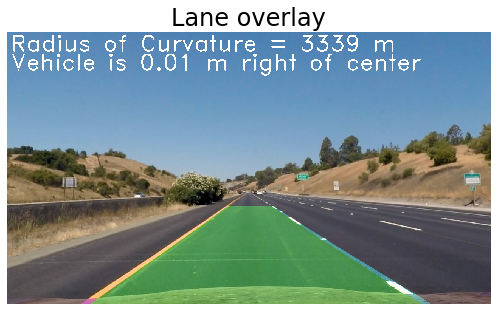

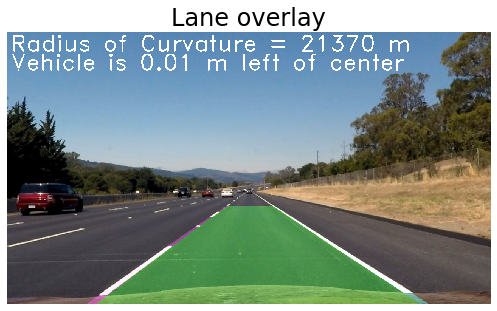

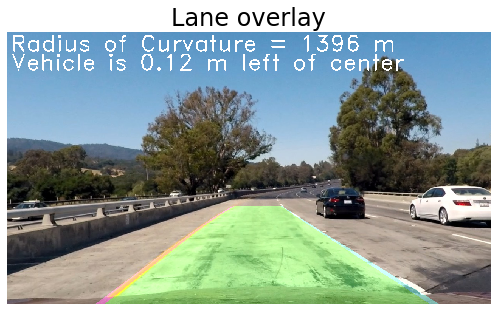

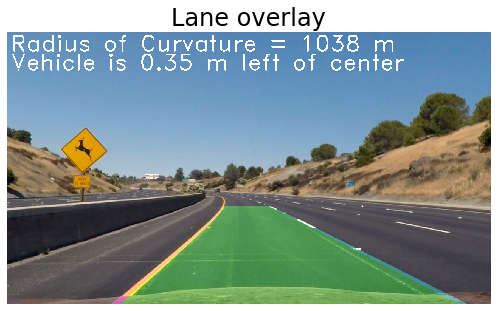

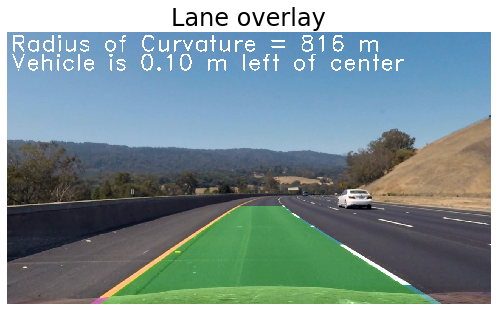

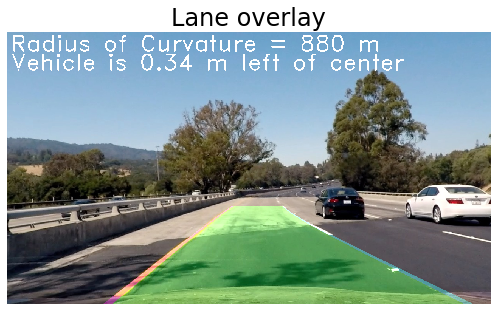

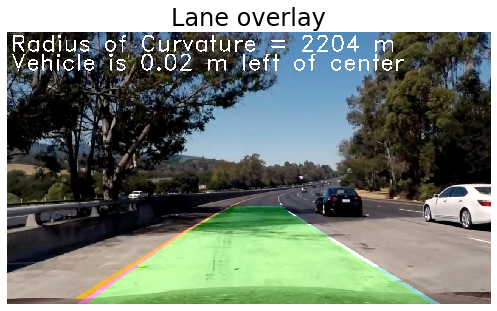

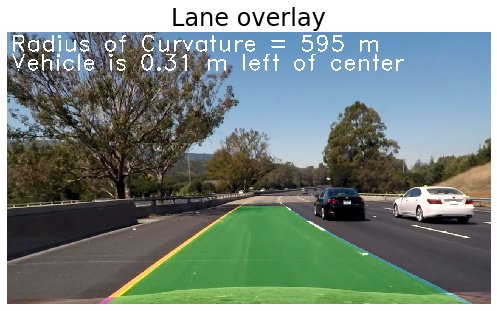

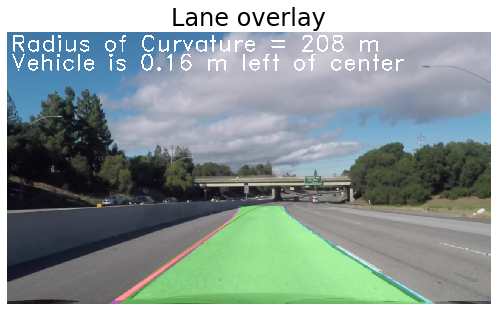

In [56]:
def draw_lanes(img, warped_binary_image, left_fitx, right_fitx, ploty, Minv):
    # Create an empty image to draw the lines on
    # Create an empty 2-D image
    warp_zero = np.zeros_like(warped_binary_image).astype(np.uint8)
    # Stack it 3 times for R,G,B channels
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    

    # Recast the x and y points into usable format for cv2.fillPoly()
    # Join x,y coordinates in a single 2D array and transpose them so each row represents a x,y coordinate
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    # Flip upside down for compatibility in ordering corners for cv2.fillpoly()
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    # Combine the left and right points horizontally
    pts = np.hstack([pts_left, pts_right])

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))
    cv2.polylines(color_warp, np.int_([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int_([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    unwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, unwarp, 0.3, 0)

    return result

# Extract lanes and fit a polynomial over a warped binary image
def warp_lanes_with_info(idx, warped_binary_img):
    # Obtain lane pixels
    leftx, lefty, rightx, righty, output_img = find_lane_pixels(warped_binary_img)
    # Fit a polynomial over pixels
    left_fitx, right_fitx, ploty, left_lane_coeffs, right_lane_coeffs = fit_polynomial(leftx, lefty, rightx, righty, warped_binary_img.shape)

    # Determine radius of curvature at the maximum y position
    left_r, right_r = measure_curvature(left_lane_coeffs, right_lane_coeffs, np.max(ploty))
    # Determine car offset from lane center
    offset = lane_center_offset(warped_binary_img.shape, left_lane_coeffs, right_lane_coeffs)

    img = np.copy(raw_undist_images[idx])
    output_img = draw_lanes(img, warped_binary_img, left_fitx, right_fitx, ploty, perspective_invM)

    # Draw curvature on image
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Radius of Curvature = ' + str(np.int((left_r+right_r) / 2)) + ' m'
    cv2.putText(output_img, text, (10, 50), font, 2, (255,255,255), 2)
    # Draw offset on image
    font = cv2.FONT_HERSHEY_DUPLEX
    direction = 'left' if offset < 0 else 'right'
    text = 'Vehicle is {:04.2f} m {} of center'.format(np.absolute(offset), direction) 
    cv2.putText(output_img, text, (10, 100), font, 2, (255,255,255), 2)

    return output_img

# Test the lane detection on test images
def test_lane_overlay():
    # Local flag for visualisation purposes, set to true to visualise operations in this cell only
    visualisation_l = False

    if (visualisation_g | visualisation_l):      
        for idx, img in enumerate(persp_binary_imgs[:]):
            output = warp_lanes_with_info(idx, img)

            # Visualisation
            f, ax = plt.subplots(figsize=(10,5))
            ax.set_title('Lane overlay', fontsize=24)
            ax.imshow(output, cmap='gray')
            ax.axis('off')

#             plt.waitforbuttonpress()
#             plt.close()

test_lane_overlay()

## Define a Line class to manage detected lanes

In [68]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # no. of frames to track
        self.n = 10
        # x values of the last n fits of the line
        self.recent_xfitted = deque(maxlen=self.n)
        # threshold for deviation from average x values
        self.x_thresh = 50
        #average x values of the fitted line over the last n iterations
        self.bestx = None
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = deque(maxlen=self.n)  
        #polynomial coefficients for the most recent fit
        self.current_fit = None
        # threshold for deviation from previous fit
        self.fit_thresh = np.array([0.001, 1.0, 100.0]) # TODO: determine value
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

    def add_newx(self, newx):
        '''Store x values for a frame if they are within the threshold from previous N frames and return True if successful.'''
        if len(self.recent_xfitted) > 0:
            
            if np.absolute(self.bestx - newx).all() < self.x_thresh:
                self.recent_xfitted.append(newx)
                self.bestx = np.mean(np.array(self.recent_xfitted), 0)

        else:
            self.recent_xfitted.append(newx)
            self.bestx = newx

    def add_new_fit(self, new_fit):
        '''Store polynomial fit for a frame if they are within the threshold from previous frame and return True if successful.'''
        # if self.current_fit is not None:
        #     self.diffs = np.absolute(new_fit - self.current_fit)

        #     if self.diffs[0] > self.fit_thresh[0] or \
        #         self.diffs[1] > self.fit_thresh[1] or \
        #         self.diffs[2] > self.fit_thresh[2]:

        #         self.detected = False
        #         return False
  
        # self.current_fit.append(new_fit)
        # self.detected = True
        # return True

        self.current_fit = new_fit

    def update_roc(self, new_r):
        '''Updates radius of curvature as the average of previous and current value after sanity checking.'''
        if self.radius_of_curvature is None:
            self.radius_of_curvature = new_r
        elif new_r > self.radius_of_curvature * 2 or new_r < self.radius_of_curvature * 0.5:
            return

        self.radius_of_curvature = (self.radius_of_curvature + new_r) / 2    



## Define the image processing pipeline

Define the pipeline to process each video frame and detect lane lines.

In [ ]:
# Checks if 2 values are within the threshold reference
def within_tolerance(a, b, thresh):
    # print(np.absolute(a - b))
    if np.absolute(a - b) < thresh:
        return True
    else:
        return False

# Complete pipeline from undistorting an image to returning the image with lane lines overlayed
def pipeline(img, c_thresh=(180, 255), g_thresh=(30,255), m_thresh=(80,255), d_thresh=(0.7,1.3), ksize=9):
    # PREPROCESSING
    # Undistort
    undist = correct_distortion(img, cam_mtx, dist_mtx)
    # Generate thresholded binary images
    colour_binary = saturation_threshold(undist, c_thresh)
    grad_binary = combined_gradient_thresholding(undist, g_thresh, m_thresh, d_thresh, ksize)
    combined_binary = or_combine_binaries(grad_binary, colour_binary)
    # Apply perspective transform
    warped_binary = cv2.warpPerspective(combined_binary, perspective_M, (img.shape[1], img.shape[0]))

    # LANE DETECTION
    # Detect lanes
    # Obtain lane pixels based on previous detection
    if left_lane.detected == False or right_lane.detected == False:
        # print('Blind search')
        leftx, lefty, rightx, righty, output_img = find_lane_pixels(warped_binary)
    else:
        # print('Focused search')
        leftx, lefty, rightx, righty, output_img = focus_find_lane_pixels(warped_binary, left_lane.current_fit, right_lane.current_fit)

    # Fit a polynomial over pixels
    left_fitx, right_fitx, ploty, left_lane_coeffs, right_lane_coeffs = fit_polynomial(leftx, lefty, rightx, righty, warped_binary.shape)

    # Sanity check- lane pixels
    # Assert lanes are parallel at the top, middle and bottom within a threshold,
    # otherwise discard the lane polynomial and use previous frame's measurements
    px_thresh = 50
    lane_width = 3.7 # metres
    width_thresh = 0.1 # 10%
    top = left_fitx[0] - right_fitx[0]
    middle = left_fitx[left_fitx.shape[0]//2] - right_fitx[right_fitx.shape[0]//2]
    bottom = left_fitx[-1] - right_fitx[-1]

    # Additionally, assert that the lane is approximately 3.7m wide near the car
    if within_tolerance(top, middle, px_thresh) and \
        within_tolerance(middle, bottom, px_thresh) and \
        within_tolerance(bottom, top, px_thresh) and \
        (1-width_thresh) * lane_width < np.absolute(bottom * xm_per_pix) < (1+width_thresh) * lane_width:
            # print('Good')
            left_lane.add_newx(left_fitx)
            right_lane.add_newx(right_fitx)

            left_lane.add_new_fit(left_lane_coeffs)
            right_lane.add_new_fit(right_lane_coeffs)
    else:
        # print('Bad')
        pass

    # Determine radius of curvature at the maximum y position
    left_r, right_r = measure_curvature(left_lane.current_fit, right_lane.current_fit, np.max(ploty))
    left_lane.update_roc(left_r)
    right_lane.update_roc(right_r)

    # Determine car offset from lane center
    offset = lane_center_offset(warped_binary.shape, left_lane.current_fit, right_lane.current_fit)
    
    # Draw lanes overlay and reverse perspective transform
    output_img = draw_lanes(img, warped_binary, left_lane.bestx, right_lane.bestx, ploty, perspective_invM)

    # Draw curvature on image
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Radius of Curvature = ' + str(np.int((left_lane.radius_of_curvature+right_lane.radius_of_curvature) / 2)) + ' m'
    cv2.putText(output_img, text, (10, 50), font, 2, (255,255,255), 2)
    # Draw offset on image
    font = cv2.FONT_HERSHEY_DUPLEX
    direction = 'left' if offset < 0 else 'right'
    text = 'Vehicle is {:04.2f} m {} of center'.format(np.absolute(offset), direction) 
    cv2.putText(output_img, text, (10, 100), font, 2, (255,255,255), 2)

    return output_img


# Evaluate:
# 1. Sanity checks:
#   - lane width - 3.7m
#   - Coefficients:
        # - 1st: direction of curve- shouldn't be +ve/-ve pairing
        # - 2nd: intensity of curve- should be close to each other
        # - 
# Compare ROC- should be similar
# Compare with previous frames
    # Current lines similar to previous lines- compare coefficients (current vs. previous)
# Check lane lines are parallel- (3 points: bottom, middle, top)

left_lane = Line()
right_lane = Line()

def test_pipeline(img):
    plt.imshow(pipeline(img))

# test_pipeline(raw_undist_images[-1])

## Process video

In [ ]:
left_lane = Line()
right_lane = Line()

# Handle video file
output = 'test_videos_output/project_video.mp4'
input = VideoFileClip('test_videos/project_video.mp4')
clip = input.fl_image(pipeline)
%timeit clip.write_videofile(output, threads=6, audio=False, verbose=False, logger=None)


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>""".format(output))

In [ ]:
# TODO: Fails on first frame so requires workaround in the form of masking
# Additionally, could also try to fit sliding window based on polynomial from 
# previous windows when no pixels are found in a window instead of the 
# next sliding window being positioned directly above the previous window

# left_lane = Line()
# right_lane = Line()

# # Handle video file
# output = 'test_videos_output/challenge_video.mp4'
# input = VideoFileClip('test_videos/challenge_video.mp4').subclip(0,5)
# clip = input.fl_image(pipeline)
# %time clip.write_videofile(output, audio=False, verbose=False)